In [1]:
import kagglehub

path = kagglehub.dataset_download("emmarex/plantdisease")

print("Path to dataset files:", path)

C:\Users\jeffr\AppData\Roaming\Python\Python313\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


  1%|          | 4.00M/658M [00:12<33:49, 338kB/s]


KeyboardInterrupt: 

In [ ]:
import cv2 as cv
import numpy as np
import os
import pandas as pd

In [ ]:
os.listdir(path)

['PlantVillage', 'plantvillage']

In [ ]:
print("plantvillage:")
os.listdir(f"{path}/plantvillage")  # empty

print("PlantVillage:")
os.listdir(f"{path}/PlantVillage")

plantvillage:
PlantVillage:


['Pepper__bell___Bacterial_spot',
 'Potato___healthy',
 'Tomato_Leaf_Mold',
 'Tomato__Tomato_YellowLeaf__Curl_Virus',
 'Tomato_Bacterial_spot',
 'Tomato_Septoria_leaf_spot',
 'Tomato_healthy',
 'Tomato_Spider_mites_Two_spotted_spider_mite',
 'Tomato_Early_blight',
 'Tomato__Target_Spot',
 'Pepper__bell___healthy',
 'Potato___Late_blight',
 'Tomato_Late_blight',
 'Potato___Early_blight',
 'Tomato__Tomato_mosaic_virus']

In [ ]:
path += "/PlantVillage"
os.listdir(f"{path}/Potato___Early_blight")[:5]

['ac6c3aea-ad58-4b46-b0d2-195dba86e0f6___RS_Early.B 7926.JPG',
 '8ce2ee77-109f-4a08-bee9-2877c2201056___RS_Early.B 6834.JPG',
 '9fa151cd-43d7-42e1-9235-72f58c584a4b___RS_Early.B 8581.JPG',
 '212c3c65-e30e-496f-ab5e-c2f4b0446d8f___RS_Early.B 8195.JPG',
 'b83aea19-9485-412f-808d-c0a590d75388___RS_Early.B 6951.JPG']

In [ ]:
from os.path import exists

color_path = "data/color"
gray_path = "data/gray"

os.makedirs(color_path, exist_ok=True)
os.makedirs(gray_path, exist_ok=True)

In [ ]:
import shutil

# Copy recursively.
# dirs_exist_ok=True allows copying into the existing 'data/color' directory.
shutil.copytree(path, color_path, dirs_exist_ok=True)

os.listdir(color_path)[:5]

['Tomato_healthy',
 'Tomato_Leaf_Mold',
 'Tomato_Bacterial_spot',
 'Tomato_Early_blight',
 'Pepper__bell___healthy']

In [ ]:
shutil.copytree(color_path, gray_path, dirs_exist_ok=True)
os.listdir(gray_path)[:5]

['Tomato_healthy',
 'Tomato_Leaf_Mold',
 'Tomato_Bacterial_spot',
 'Tomato_Early_blight',
 'Pepper__bell___healthy']

In [ ]:
os.listdir(f"{gray_path}/Potato___Early_blight")[:5]

['66c5930d-2169-4ec1-9919-28088d5447f7___RS_Early.B 8822.JPG',
 '9846eead-9fc1-4c35-8b63-1adfbdf0b118___RS_Early.B 8325.JPG',
 'b6c68639-ad01-41f9-a10c-4233423ea2b0___RS_Early.B 8573.JPG',
 '9ca7d203-7b7c-4f5c-911f-fc225f3c5b77___RS_Early.B 7557.JPG',
 'ca2c9c12-f2ba-4864-806c-b85f4fb36f92___RS_Early.B 7640.JPG']

In [ ]:
def apply_change_to_all_images(path, change_function, grayscale=False):
    for dir in os.listdir(path):
        sub_dir = os.path.join(path, dir)
        if not os.path.isdir(sub_dir):
            continue

        for filename in os.listdir(sub_dir):
            file_path = os.path.join(sub_dir, filename)

            if grayscale:
                img = cv.imread(file_path, cv.IMREAD_GRAYSCALE)
            else:
                img = cv.imread(file_path)
            if img is not None:
                img_gray = change_function(img)
                cv.imwrite(file_path, img_gray)
            else:
                print(f"Warning: Could not read image {file_path}")

In [ ]:
apply_change_to_all_images(gray_path, lambda x: cv.cvtColor(x, cv.COLOR_BGR2GRAY))

In [ ]:
invalid_file = "data/gray/Tomato__Tomato_YellowLeaf__Curl_Virus/svn-r6Yb5c"
os.remove(invalid_file)

In [ ]:
from google.colab.patches import cv2_imshow as cv_imshow

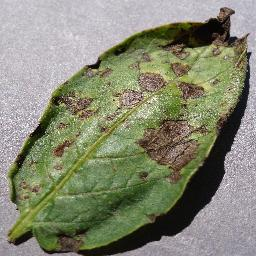

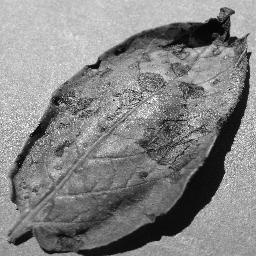

In [ ]:
example_subpath = (
    "/Potato___Early_blight/ac6c3aea-ad58-4b46-b0d2-195dba86e0f6___RS_Early.B 7926.JPG"
)
cv_imshow(cv.imread(color_path + example_subpath))
cv_imshow(cv.imread(gray_path + example_subpath))

## Smoothing


Create a directory `/img` to store current versions of images, which makes it possible to try out transformations, keeping a record of both color and gray scale versions


In [ ]:
img_path = "data/img"
os.makedirs(img_path, exist_ok=True)
shutil.copytree(gray_path, img_path, dirs_exist_ok=True)

'data/img'

In [ ]:
apply_change_to_all_images(img_path, lambda x: cv.GaussianBlur(x, (3, 3), 0))

Original Grayscale Image:


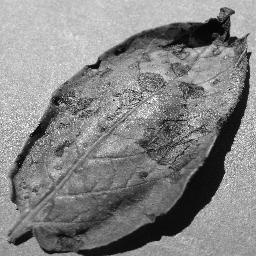

After 3x3 Gaussian Filter:


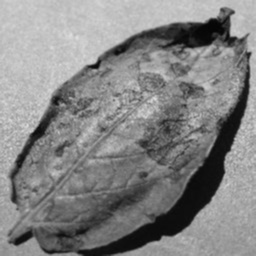

In [ ]:
print("Original Grayscale Image:")
cv_imshow(cv.imread(gray_path + example_subpath))

print("After 3x3 Gaussian Filter:")
cv_imshow(cv.imread(img_path + example_subpath))

# Leave segmentation


## Global thresholding


### Sample selection


In [ ]:
subdirs = os.listdir(img_path)
print(subdirs)

['Tomato_healthy', 'Tomato_Leaf_Mold', 'Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Pepper__bell___healthy', 'Potato___healthy', 'Tomato_Septoria_leaf_spot', 'Potato___Early_blight', 'Tomato_Spider_mites_Two_spotted_spider_mite', 'Pepper__bell___Bacterial_spot', 'Tomato__Tomato_mosaic_virus', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato_Late_blight', 'Tomato__Target_Spot', 'Potato___Late_blight']


In [ ]:
cnt = np.array([len(os.listdir(img_path + "/" + subdir)) for subdir in subdirs])

In [ ]:
mean = np.mean(cnt)
median = np.median(cnt)
std_dev = np.std(cnt)
print(f"Mean: {mean}\nMedian: {median}\nStandard Deviation: {std_dev}")

Mean: 1375.8666666666666
Median: 1404.0
Standard Deviation: 719.2348588758905


In [ ]:
print(f"Min: {np.min(cnt)}\nMax: {np.max(cnt)}")

Min: 152
Max: 3208


In [ ]:
sample_ratio = 0.05
k = int(sample_ratio * median)
print(k)

70


In [ ]:
samples = dict()
for subdir in subdirs:
    samples[subdir] = np.random.choice(os.listdir(img_path + "/" + subdir), k)

for dir, imgs in samples.items():
    assert len(imgs) == k

### Grid search to choose threshold hyperparameter


In [ ]:
def get_area_ratio(mask):
    # Ratio of foreground (255) to total area
    return np.count_nonzero(mask) / mask.size


def get_cc_metrics(mask):
    # Returns num_cc and largest_cc_ratio
    num_labels, labels, stats, centroids = cv.connectedComponentsWithStats(mask)
    if num_labels <= 1:  # Only background
        return 0, 0.0

    # stats[i, cv.CC_STAT_AREA] contains the area of i-th component
    # Skip index 0 as it is the background
    areas = stats[1:, cv.CC_STAT_AREA]
    largest_cc_area = np.max(areas)
    total_fg_area = np.sum(areas)

    largest_cc_ratio = largest_cc_area / total_fg_area if total_fg_area > 0 else 0
    return num_labels - 1, largest_cc_ratio


def get_shape_metrics(mask):
    # Returns perimeter_to_area and solidity
    contours, _ = cv.findContours(mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    if not contours:
        return 0.0, 0.0

    # Find largest contour by area
    cnt = max(contours, key=cv.contourArea)
    area = cv.contourArea(cnt)
    if area == 0:
        return 0.0, 0.0

    perimeter = cv.arcLength(cnt, True)
    p_to_a = perimeter**2 / area

    hull = cv.convexHull(cnt)
    hull_area = cv.contourArea(hull)
    solidity = area / hull_area if hull_area > 0 else 0

    return p_to_a, solidity

In [ ]:
def apply_threshold_and_evaluate(samples, th):
    metrics = {
        "area_ratio": [],
        "largest_cc_ratio": [],
        "num_cc": [],
        "perimeter_to_area": [],
        "solidity": [],
    }

    for subdir in samples.keys():
        for file_name in samples[subdir]:
            file_path = img_path + "/" + subdir + "/" + file_name
            img = cv.imread(file_path, cv.IMREAD_GRAYSCALE)

            ret, mask = cv.threshold(img, th, 255, cv.THRESH_BINARY_INV)

            metrics["area_ratio"].append(get_area_ratio(mask))

            num_cc, lcc_ratio = get_cc_metrics(mask)
            metrics["num_cc"].append(num_cc)
            metrics["largest_cc_ratio"].append(lcc_ratio)

            p2a, sol = get_shape_metrics(mask)
            metrics["perimeter_to_area"].append(p2a)
            metrics["solidity"].append(sol)
    # Return mean and standard deviation to compare between thresholds
    return {k: (np.mean(v), np.std(v)) for k, v in metrics.items()}

In [ ]:
def evaluate_thresholds(thresholds):
    results = []
    for th in thresholds:
        avg_metrics = apply_threshold_and_evaluate(samples, th)
        avg_metrics["threshold"] = th
        results.append(avg_metrics)

    return results

In [ ]:
thresholds = [int(x) for x in np.linspace(85, 145, 4)]

df_results = pd.DataFrame(evaluate_thresholds(thresholds))
display(df_results)

,area_ratio,largest_cc_ratio,num_cc,perimeter_to_area,solidity,threshold
0,"(0.20230647495814733, 0.12360953159277988)","(0.6049935540267604, 0.24811469040399814)","(85.85619047619048, 53.903629039080165)","(170.36502740128643, 133.6836022514948)","(0.5484891839595831, 0.18675241757791972)",85
1,"(0.3279571533203125, 0.14574326295543866)","(0.7664216812959451, 0.23578330679998652)","(123.60285714285715, 95.4846055476936)","(201.67391933741501, 180.0350880767971)","(0.6418188186827161, 0.18905567568064816)",105
2,"(0.5117755562918527, 0.1704555147806277)","(0.9126341742828784, 0.13858810066215438)","(142.9552380952381, 112.30630265225322)","(135.28947064909826, 136.8497500666855)","(0.7894359346969577, 0.15368864636379476)",125
3,"(0.7207922072637649, 0.1737110829446395)","(0.9693498552868521, 0.05706328919499645)","(109.92285714285714, 95.31881716703396)","(73.24904032783782, 72.65069371538588)","(0.8933836018515081, 0.09470092909964495)",145


In [ ]:
import matplotlib.pyplot as plt


def display_comparison_grid(subdirs, img_path, color_path, thresholds):
    n_classes = len(subdirs)
    n_th = len(thresholds)
    cols = 2 + n_th
    fig, axes = plt.subplots(n_classes, cols, figsize=(20, (cols + 1) * n_classes))

    for i, subdir in enumerate(subdirs):
        # Pick a random image from the category
        all_files = os.listdir(os.path.join(img_path, subdir))
        random_file = np.random.choice(all_files)

        # Load paths
        color_file = os.path.join(color_path, subdir, random_file)
        blurred_file = os.path.join(img_path, subdir, random_file)

        # Read images
        img_color = cv.cvtColor(cv.imread(color_file), cv.COLOR_BGR2RGB)
        img_blurred = cv.imread(blurred_file, cv.IMREAD_GRAYSCALE)

        # Plot Original
        axes[i, 0].imshow(img_color)
        axes[i, 0].set_title(f"{subdir}\nOriginal")
        axes[i, 0].axis("off")

        # Plot Blurred (Grayscale)
        axes[i, 1].imshow(img_blurred, cmap="gray")
        axes[i, 1].set_title("Blurred Grayscale")
        axes[i, 1].axis("off")

        for idx, th in enumerate(thresholds):
            _, mask1 = cv.threshold(img_blurred, th, 255, cv.THRESH_BINARY_INV)
            axes[i, idx + 2].imshow(mask1, cmap="gray")
            axes[i, idx + 2].set_title(f"Threshold {th}")
            axes[i, idx + 2].axis("off")

    plt.tight_layout()
    plt.show()

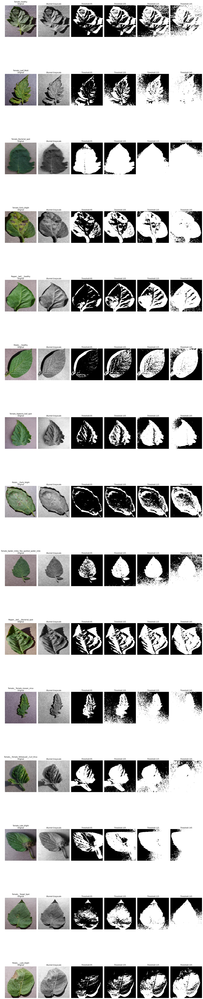

In [ ]:
display_comparison_grid(subdirs, img_path, color_path, thresholds)

In [ ]:
TH = 125

In [ ]:
global_th_path = "data/global_th"
os.makedirs(global_th_path, exist_ok=True)
shutil.copytree(img_path, global_th_path, dirs_exist_ok=True)

'data/global_th'

In [ ]:
apply_change_to_all_images(
    global_th_path, lambda x: cv.threshold(x, TH, 255, cv.THRESH_BINARY_INV)[1]
)

In [ ]:
otsu_path = "data/otsu"
os.makedirs(otsu_path, exist_ok=True)
shutil.copytree(img_path, otsu_path, dirs_exist_ok=True)

'data/otsu'

In [ ]:
apply_change_to_all_images(
    otsu_path,
    lambda x: (cv.threshold(x, 0, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)[1]),
    grayscale=True,
)

## Evaluation

### Region based

1. Foreground area ratio (~50%)
2. Largest connected component ratio (higher is better)
3. Number of connected components (lower is better)

### Shape based

1. Perimeter-to-area ratio (lower is better)
2. Solidity (higher is better)

### Explanation

- area ratio → under/over-segmentation
- connected components → fragmentation/noise
- largest CC ratio → dominance of main leaf region
- perimeter-to-area → boundary roughness
- solidity → compactness/coherence


## Segmentation with OTSU


In [ ]:
def apply_clahe(img, clip_limit=2.0, tile_grid_size=(8, 8)):
    clahe = cv.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    return clahe.apply(img)


def extract_lab_a_channel(img):
    lab = cv.cvtColor(img, cv.COLOR_BGR2LAB)
    return lab[:, :, 1]


def otsu_binary_inv(img):
    return cv.threshold(img, 0, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)[1]

In [ ]:
def segment_with_otsu_gray(img):
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    gray = cv.GaussianBlur(gray, (3, 3), 0)
    mask = otsu_binary_inv(gray)
    return mask


def segment_with_otsu_lab_a(img, clip_limit=2.0, tile_grid_size=(8, 8)):
    a_channel = extract_lab_a_channel(img)
    a_channel = apply_clahe(
        a_channel, clip_limit=clip_limit, tile_grid_size=tile_grid_size
    )
    a_channel = cv.GaussianBlur(a_channel, (3, 3), 0)
    mask = otsu_binary_inv(a_channel)
    return mask

In [ ]:
def run_segmentation_strategy(input_path, output_path, strategy_fn):
    os.makedirs(output_path, exist_ok=True)
    shutil.copytree(input_path, output_path, dirs_exist_ok=True)

    apply_change_to_all_images(output_path, strategy_fn, grayscale=False)

In [ ]:
otsu_gray_path = "data/seg_otsu_gray"
otsu_lab_a_path = "data/seg_otsu_lab_a"

run_segmentation_strategy(color_path, otsu_gray_path, segment_with_otsu_gray)

run_segmentation_strategy(
    color_path,
    otsu_lab_a_path,
    lambda img: segment_with_otsu_lab_a(img, clip_limit=2.0, tile_grid_size=(8, 8)),
)

In [ ]:
def display_segmentation_comparison(
    subdirs, color_path, otsu_gray_path, otsu_lab_a_path
):
    n_classes = len(subdirs)
    fig, axes = plt.subplots(n_classes, 3, figsize=(12, 4 * n_classes))

    if n_classes == 1:
        axes = np.expand_dims(axes, axis=0)

    for i, subdir in enumerate(subdirs):
        all_files = os.listdir(os.path.join(otsu_gray_path, subdir))
        random_file = np.random.choice(all_files)

        color_file = os.path.join(color_path, subdir, random_file)
        gray_file = os.path.join(otsu_gray_path, subdir, random_file)
        lab_file = os.path.join(otsu_lab_a_path, subdir, random_file)

        img_color = cv.cvtColor(cv.imread(color_file), cv.COLOR_BGR2RGB)
        img_gray = cv.imread(gray_file, cv.IMREAD_GRAYSCALE)
        img_lab = cv.imread(lab_file, cv.IMREAD_GRAYSCALE)

        axes[i, 0].imshow(img_color)
        axes[i, 0].set_title(f"{subdir}\nOriginal")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(img_gray, cmap="gray")
        axes[i, 1].set_title("Otsu (gray)")
        axes[i, 1].axis("off")

        axes[i, 2].imshow(img_lab, cmap="gray")
        axes[i, 2].set_title("Otsu (Lab a* + CLAHE)")
        axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

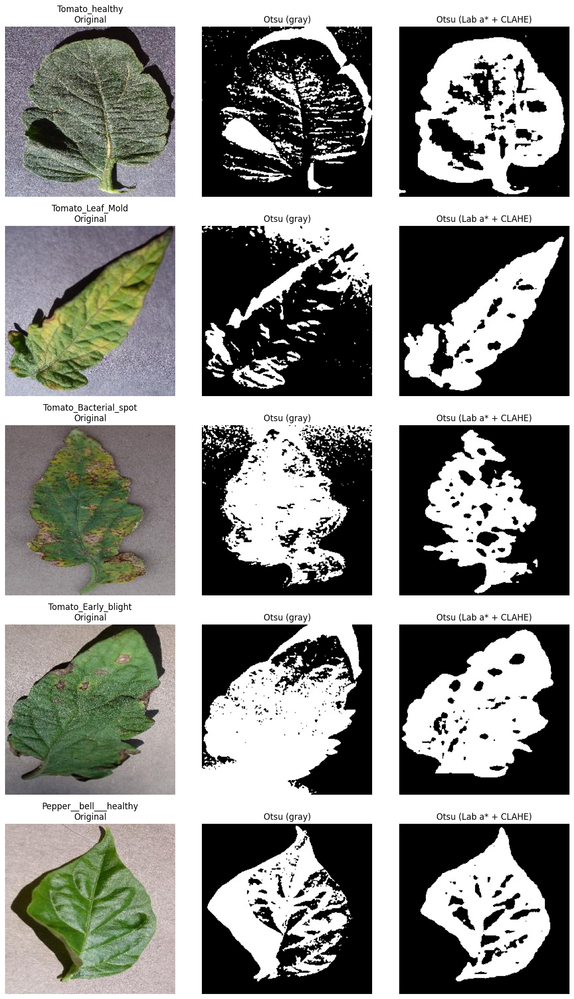

In [ ]:
display_segmentation_comparison(
    subdirs[:5], color_path, otsu_gray_path, otsu_lab_a_path
)

## Morphological post-processing


In [ ]:
def apply_morphology(mask, close_ksize=(7, 7), open_ksize=(5, 5), iterations=1):
    kernel_close = cv.getStructuringElement(cv.MORPH_ELLIPSE, close_ksize)
    kernel_open = cv.getStructuringElement(cv.MORPH_ELLIPSE, open_ksize)

    mask = cv.morphologyEx(mask, cv.MORPH_CLOSE, kernel_close, iterations=iterations)
    mask = cv.morphologyEx(mask, cv.MORPH_OPEN, kernel_open, iterations=iterations)

    return mask


def keep_largest_component(mask):
    num_labels, labels, stats, _ = cv.connectedComponentsWithStats(mask, connectivity=8)

    if num_labels <= 1:
        return mask

    largest_label = 1 + np.argmax(stats[1:, cv.CC_STAT_AREA])
    result = np.zeros_like(mask)
    result[labels == largest_label] = 255
    return result


def morphology_pipeline(
    mask, close_ksize=(7, 7), open_ksize=(5, 5), iterations=1, largest_cc=True
):
    mask = apply_morphology(
        mask, close_ksize=close_ksize, open_ksize=open_ksize, iterations=iterations
    )

    if largest_cc:
        mask = keep_largest_component(mask)

    return mask

In [ ]:
def run_morphology_strategy(
    input_path,
    output_path,
    close_ksize=(7, 7),
    open_ksize=(5, 5),
    iterations=1,
    largest_cc=True,
):
    os.makedirs(output_path, exist_ok=True)
    shutil.copytree(input_path, output_path, dirs_exist_ok=True)

    apply_change_to_all_images(
        output_path,
        lambda x: morphology_pipeline(
            x,
            close_ksize=close_ksize,
            open_ksize=open_ksize,
            iterations=iterations,
            largest_cc=largest_cc,
        ),
        grayscale=True,
    )

In [ ]:
otsu_gray_morph_path = "data/seg_otsu_gray_morph"
otsu_lab_a_morph_path = "data/seg_otsu_lab_a_morph"

run_morphology_strategy(
    otsu_gray_path,
    otsu_gray_morph_path,
    close_ksize=(7, 7),
    open_ksize=(5, 5),
    iterations=1,
    largest_cc=True,
)

run_morphology_strategy(
    otsu_lab_a_path,
    otsu_lab_a_morph_path,
    close_ksize=(7, 7),
    open_ksize=(5, 5),
    iterations=1,
    largest_cc=True,
)

In [ ]:
def display_morphology_comparison(
    subdirs,
    color_path,
    otsu_gray_path,
    otsu_gray_morph_path,
    otsu_lab_a_path,
    otsu_lab_a_morph_path,
):
    n_classes = len(subdirs)
    fig, axes = plt.subplots(n_classes, 5, figsize=(18, 4 * n_classes))

    if n_classes == 1:
        axes = np.expand_dims(axes, axis=0)

    for i, subdir in enumerate(subdirs):
        all_files = os.listdir(os.path.join(otsu_gray_path, subdir))
        random_file = np.random.choice(all_files)

        color_file = os.path.join(color_path, subdir, random_file)
        gray_file = os.path.join(otsu_gray_path, subdir, random_file)
        gray_morph_file = os.path.join(otsu_gray_morph_path, subdir, random_file)
        lab_file = os.path.join(otsu_lab_a_path, subdir, random_file)
        lab_morph_file = os.path.join(otsu_lab_a_morph_path, subdir, random_file)

        img_color = cv.cvtColor(cv.imread(color_file), cv.COLOR_BGR2RGB)
        img_gray = cv.imread(gray_file, cv.IMREAD_GRAYSCALE)
        img_gray_morph = cv.imread(gray_morph_file, cv.IMREAD_GRAYSCALE)
        img_lab = cv.imread(lab_file, cv.IMREAD_GRAYSCALE)
        img_lab_morph = cv.imread(lab_morph_file, cv.IMREAD_GRAYSCALE)

        axes[i, 0].imshow(img_color)
        axes[i, 0].set_title(f"{subdir}\nOriginal")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(img_gray, cmap="gray")
        axes[i, 1].set_title("Otsu (gray)")
        axes[i, 1].axis("off")

        axes[i, 2].imshow(img_gray_morph, cmap="gray")
        axes[i, 2].set_title("Otsu gray + Morph")
        axes[i, 2].axis("off")

        axes[i, 3].imshow(img_lab, cmap="gray")
        axes[i, 3].set_title("Otsu (Lab a* + CLAHE)")
        axes[i, 3].axis("off")

        axes[i, 4].imshow(img_lab_morph, cmap="gray")
        axes[i, 4].set_title("Lab a* + CLAHE + Morph")
        axes[i, 4].axis("off")

    plt.tight_layout()
    plt.show()

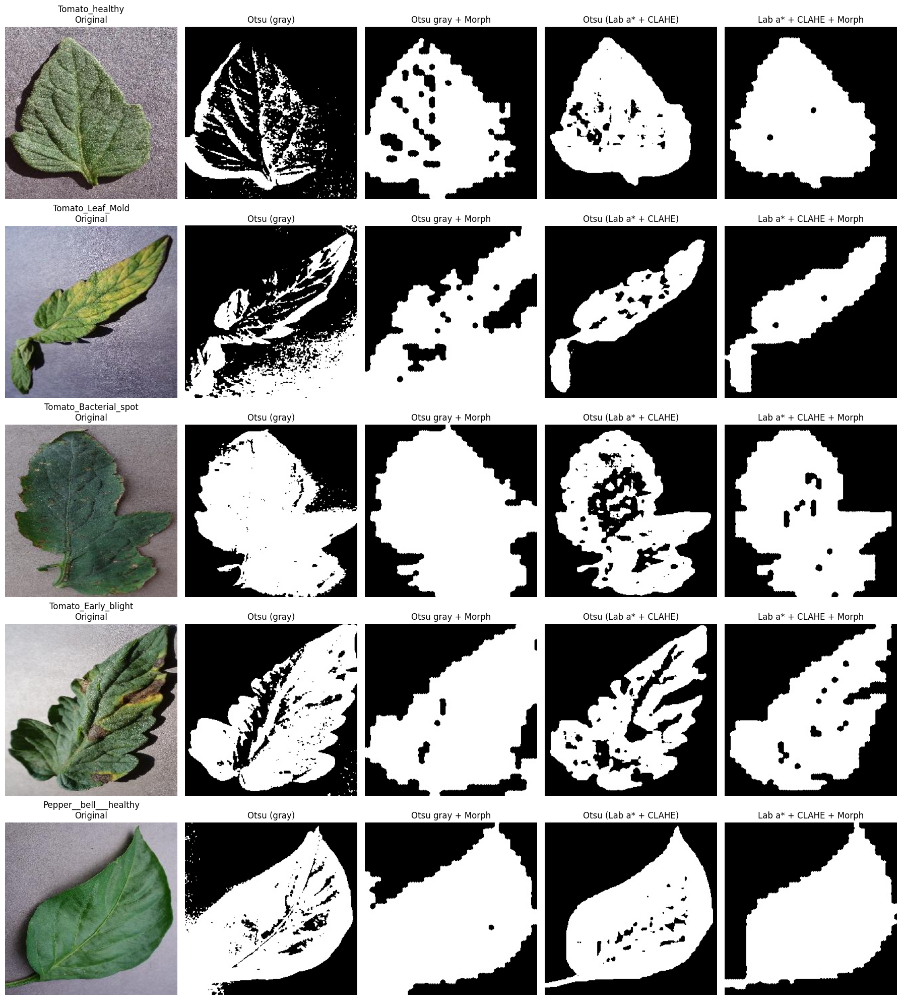

In [ ]:
display_morphology_comparison(
    subdirs[:5],
    color_path,
    otsu_gray_path,
    otsu_gray_morph_path,
    otsu_lab_a_path,
    otsu_lab_a_morph_path,
)

In [ ]:
def evaluate_masks_in_path(samples, mask_path):
    metrics = {
        "area_ratio": [],
        "largest_cc_ratio": [],
        "num_cc": [],
        "perimeter_to_area": [],
        "solidity": [],
    }

    for subdir in samples.keys():
        for file_name in samples[subdir]:
            file_path = os.path.join(mask_path, subdir, file_name)
            mask = cv.imread(file_path, cv.IMREAD_GRAYSCALE)

            if mask is None:
                continue

            metrics["area_ratio"].append(get_area_ratio(mask))

            num_cc, lcc_ratio = get_cc_metrics(mask)
            metrics["num_cc"].append(num_cc)
            metrics["largest_cc_ratio"].append(lcc_ratio)

            p2a, sol = get_shape_metrics(mask)
            metrics["perimeter_to_area"].append(p2a)
            metrics["solidity"].append(sol)

    return {k: (np.mean(v), np.std(v)) for k, v in metrics.items()}

In [ ]:
results_segmentation = {
    "otsu_gray": evaluate_masks_in_path(samples, otsu_gray_path),
    "otsu_gray_morph": evaluate_masks_in_path(samples, otsu_gray_morph_path),
    "otsu_lab_a": evaluate_masks_in_path(samples, otsu_lab_a_path),
    "otsu_lab_a_morph": evaluate_masks_in_path(samples, otsu_lab_a_morph_path),
}

pd.DataFrame(results_segmentation)

,otsu_gray,otsu_gray_morph,otsu_lab_a,otsu_lab_a_morph
area_ratio,"(0.4332830665225074, 0.1305910261409096)","(0.5396205357142857, 0.13910846617131795)","(0.38135028657459075, 0.11208201841709742)","(0.44023581368582587, 0.12153085367242243)"
largest_cc_ratio,"(0.9450738220633231, 0.09620665189722964)","(0.9932442823029578, 0.0036550601243084467)","(0.9840436737278226, 0.03787144059942545)","(0.9928026841978517, 0.0021788698476896498)"
num_cc,"(149.04666666666665, 62.291134531888574)","(46.66571428571429, 15.651978901640998)","(86.07047619047619, 24.348829731571332)","(44.48571428571429, 10.574735647457361)"
perimeter_to_area,"(355.1680406158725, 381.86614657922263)","(96.99154222245869, 62.367476270820084)","(180.33182938945984, 90.67691781836469)","(88.00873346038512, 30.00820534180273)"
solidity,"(0.7652910446840494, 0.13865930180786212)","(0.8464311653369955, 0.09660011918200591)","(0.796723621935911, 0.08653955512949894)","(0.8505126163669395, 0.06954100661684336)"


After comparing the segmentation strategies both visually and quantitatively, we selected **Otsu on the Lab a\* channel with CLAHE, followed by morphological post-processing**, as the best option. In the visual analysis, this variant produced cleaner and more stable masks, with better separation between the leaf and the background than the grayscale-based alternatives.

The quantitative results also support this choice: this strategy yielded fewer connected components, higher solidity, and a lower perimeter-to-area ratio, indicating a more compact and less fragmented leaf region. Although some other variants showed a larger foreground area, that metric alone was not enough to assess quality, since over-segmentation can also increase the white region.

For these reasons, we use Otsu Lab a\* + Morphology as the final segmentation output and continue the rest of the pipeline from this mask.


## Edge detection using the best segmentation


In [ ]:
def canny_edges(img, low_threshold=50, high_threshold=150):
    return cv.Canny(img, low_threshold, high_threshold)


def masked_canny_transformation(img, mask, low_threshold=80, high_threshold=180):
    masked_img = cv.bitwise_and(img, img, mask=mask)
    masked_img = cv.GaussianBlur(masked_img, (5, 5), 0)
    return canny_edges(
        masked_img, low_threshold=low_threshold, high_threshold=high_threshold
    )

In [ ]:
def apply_change_to_all_images_with_mask(
    base_img_path, mask_path, output_path, transformation, grayscale=False
):
    valid_exts = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff"}

    os.makedirs(output_path, exist_ok=True)

    for subdir in os.listdir(mask_path):
        subdir_mask_path = os.path.join(mask_path, subdir)
        subdir_base_path = os.path.join(base_img_path, subdir)
        subdir_output_path = os.path.join(output_path, subdir)

        if not os.path.isdir(subdir_mask_path):
            continue

        os.makedirs(subdir_output_path, exist_ok=True)

        for file_name in os.listdir(subdir_mask_path):
            ext = os.path.splitext(file_name)[1].lower()
            if ext not in valid_exts:
                continue

            mask_file = os.path.join(subdir_mask_path, file_name)
            base_file = os.path.join(subdir_base_path, file_name)
            output_file = os.path.join(subdir_output_path, file_name)

            flag = cv.IMREAD_GRAYSCALE if grayscale else cv.IMREAD_COLOR
            img = cv.imread(base_file, flag)
            mask = cv.imread(mask_file, cv.IMREAD_GRAYSCALE)

            if img is None or mask is None:
                continue

            result = transformation(img, mask)
            cv.imwrite(output_file, result)

In [ ]:
best_edges_path = "data/edges_best_segmentation"

In [ ]:
apply_change_to_all_images_with_mask(
    img_path,
    otsu_lab_a_morph_path,
    best_edges_path,
    lambda img, mask: masked_canny_transformation(
        img, mask, low_threshold=80, high_threshold=180
    ),
    grayscale=True,
)

In [ ]:
def overlay_edges_on_color_image(color_img, edges, edge_color=(255, 0, 0)):
    overlay = color_img.copy()
    overlay[edges > 0] = edge_color
    return overlay

In [ ]:
def display_best_edge_detection(subdirs, color_path, best_mask_path, best_edges_path):
    n_classes = len(subdirs)
    fig, axes = plt.subplots(n_classes, 4, figsize=(16, 4 * n_classes))

    if n_classes == 1:
        axes = np.expand_dims(axes, axis=0)

    for i, subdir in enumerate(subdirs):
        all_files = os.listdir(os.path.join(best_mask_path, subdir))
        random_file = np.random.choice(all_files)

        color_file = os.path.join(color_path, subdir, random_file)
        mask_file = os.path.join(best_mask_path, subdir, random_file)
        edge_file = os.path.join(best_edges_path, subdir, random_file)

        img_color = cv.cvtColor(cv.imread(color_file), cv.COLOR_BGR2RGB)
        img_mask = cv.imread(mask_file, cv.IMREAD_GRAYSCALE)
        img_edges = cv.imread(edge_file, cv.IMREAD_GRAYSCALE)

        img_overlay = overlay_edges_on_color_image(
            img_color, img_edges, edge_color=(255, 0, 0)
        )

        axes[i, 0].imshow(img_color)
        axes[i, 0].set_title(f"{subdir}\nOriginal")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(img_mask, cmap="gray")
        axes[i, 1].set_title("Best mask")
        axes[i, 1].axis("off")

        axes[i, 2].imshow(img_edges, cmap="gray")
        axes[i, 2].set_title("Canny edges")
        axes[i, 2].axis("off")

        axes[i, 3].imshow(img_overlay)
        axes[i, 3].set_title("Overlay")
        axes[i, 3].axis("off")

    plt.tight_layout()
    plt.show()

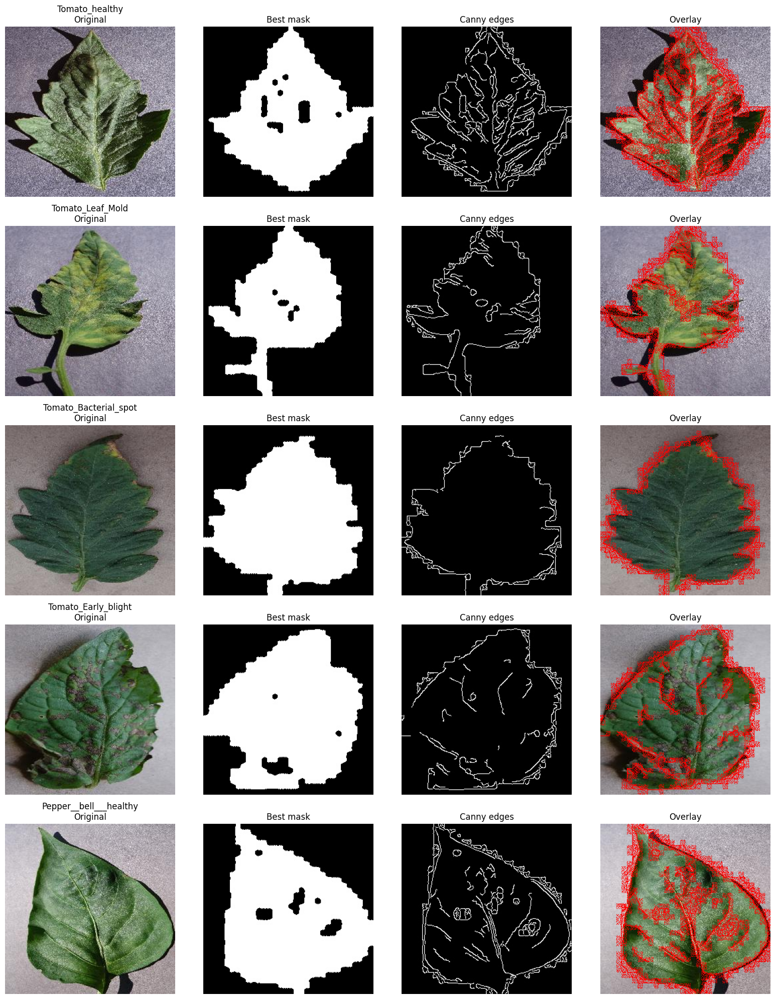

In [ ]:
display_best_edge_detection(
    subdirs[:5], color_path, otsu_lab_a_morph_path, best_edges_path
)

The final Canny configuration produces cleaner and more interpretable edge maps than the initial attempts. The detected edges emphasize the outer contour of the leaf and several main internal structures, while reducing excessive texture noise. Although some diseased leaves still show additional internal edges, this behavior is consistent with the stronger appearance changes caused by lesions and damaged tissue. At this point, the edge detection stage is considered sufficiently stable to continue with the next step of the pipeline.


## Corner detection using the best segmentation


In [ ]:
def shi_tomasi_corners(
    img, max_corners=100, quality_level=0.01, min_distance=10, block_size=3
):
    corners = cv.goodFeaturesToTrack(
        img,
        maxCorners=max_corners,
        qualityLevel=quality_level,
        minDistance=min_distance,
        blockSize=block_size,
    )

    return corners

In [ ]:
def masked_shi_tomasi_transformation(
    color_img,
    gray_img,
    mask,
    max_corners=100,
    quality_level=0.01,
    min_distance=10,
    block_size=3,
):
    masked_gray = cv.bitwise_and(gray_img, gray_img, mask=mask)

    corners = shi_tomasi_corners(
        masked_gray,
        max_corners=max_corners,
        quality_level=quality_level,
        min_distance=min_distance,
        block_size=block_size,
    )

    result = color_img.copy()

    if corners is not None:
        corners = np.intp(corners)
        for corner in corners:
            x, y = corner.ravel()
            cv.circle(result, (x, y), 4, (255, 0, 0), -1)

    return result, corners

In [ ]:
def apply_corner_detection_with_mask(
    color_path, gray_path, mask_path, output_path, transformation
):
    valid_exts = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff"}

    os.makedirs(output_path, exist_ok=True)

    for subdir in os.listdir(mask_path):
        subdir_mask_path = os.path.join(mask_path, subdir)
        subdir_color_path = os.path.join(color_path, subdir)
        subdir_gray_path = os.path.join(gray_path, subdir)
        subdir_output_path = os.path.join(output_path, subdir)

        if not os.path.isdir(subdir_mask_path):
            continue

        os.makedirs(subdir_output_path, exist_ok=True)

        for file_name in os.listdir(subdir_mask_path):
            ext = os.path.splitext(file_name)[1].lower()
            if ext not in valid_exts:
                continue

            mask_file = os.path.join(subdir_mask_path, file_name)
            color_file = os.path.join(subdir_color_path, file_name)
            gray_file = os.path.join(subdir_gray_path, file_name)
            output_file = os.path.join(subdir_output_path, file_name)

            mask = cv.imread(mask_file, cv.IMREAD_GRAYSCALE)
            color_img = cv.imread(color_file, cv.IMREAD_COLOR)
            gray_img = cv.imread(gray_file, cv.IMREAD_GRAYSCALE)

            if mask is None or color_img is None or gray_img is None:
                continue

            result, _ = transformation(color_img, gray_img, mask)
            cv.imwrite(output_file, result)

In [ ]:
best_corners_path = "data/shi_tomasi_best_segmentation"

In [ ]:
apply_corner_detection_with_mask(
    color_path,
    img_path,
    otsu_lab_a_morph_path,
    best_corners_path,
    lambda color_img, gray_img, mask: masked_shi_tomasi_transformation(
        color_img,
        gray_img,
        mask,
        max_corners=60,
        quality_level=0.02,
        min_distance=12,
        block_size=3,
    ),
)

In [ ]:
def display_best_corner_detection(
    subdirs, color_path, best_mask_path, best_corners_path
):
    n_classes = len(subdirs)
    fig, axes = plt.subplots(n_classes, 3, figsize=(14, 4 * n_classes))

    if n_classes == 1:
        axes = np.expand_dims(axes, axis=0)

    for i, subdir in enumerate(subdirs):
        all_files = os.listdir(os.path.join(best_mask_path, subdir))
        random_file = np.random.choice(all_files)

        color_file = os.path.join(color_path, subdir, random_file)
        mask_file = os.path.join(best_mask_path, subdir, random_file)
        corner_file = os.path.join(best_corners_path, subdir, random_file)

        img_color = cv.cvtColor(cv.imread(color_file), cv.COLOR_BGR2RGB)
        img_mask = cv.imread(mask_file, cv.IMREAD_GRAYSCALE)
        img_corners = cv.cvtColor(cv.imread(corner_file), cv.COLOR_BGR2RGB)

        axes[i, 0].imshow(img_color)
        axes[i, 0].set_title(f"{subdir}\nOriginal")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(img_mask, cmap="gray")
        axes[i, 1].set_title("Best mask")
        axes[i, 1].axis("off")

        axes[i, 2].imshow(img_corners)
        axes[i, 2].set_title("Shi-Tomasi corners")
        axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

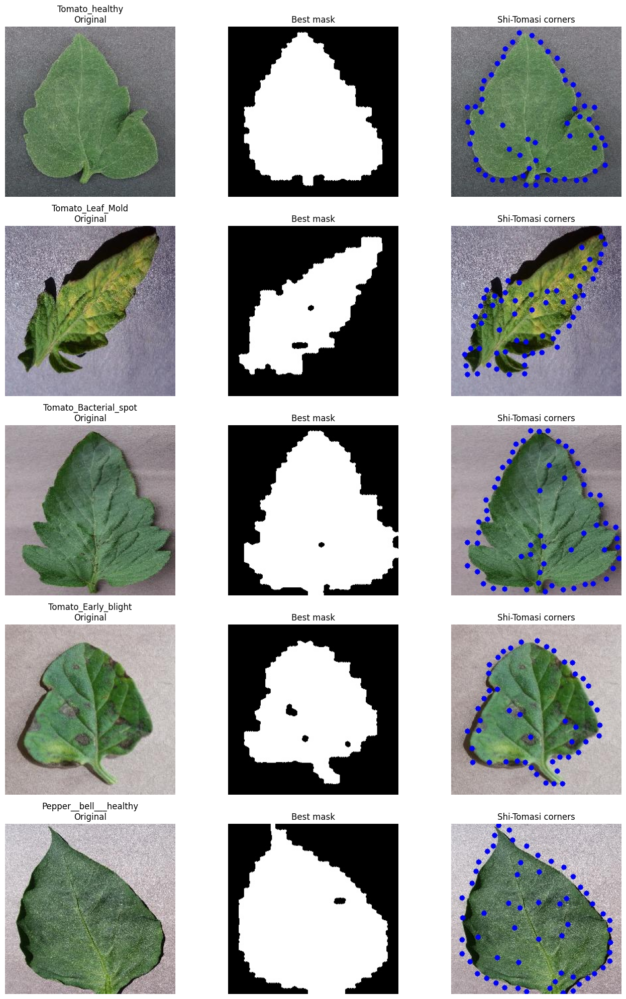

In [ ]:
display_best_corner_detection(
    subdirs[:5], color_path, otsu_lab_a_morph_path, best_corners_path
)